## 1. Network Summary

Network source - https://vk.com/annnyway

Network graph path - "vk-friends-81595441.gexf"

The graph was extracted using http://vk.com/app3861133

### 1.1 Preprocessing

In [11]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import seaborn as sns
import pandas as pd
import pygraphviz as pgv

In [12]:
G = nx.read_gexf("vk-friends-81595441.gexf")

In [13]:
labels = nx.get_node_attributes(G,'label')

count = 0
for k,v in labels.items():
    print(k, v)
    count += 1
    if count > 30:
        break

35032 Natalia Belousova
87629 Sofya Kuznetsova
441823 Sergey Portnoy
640287 Boris Orekhov
714270 Anna Hattori
1136265 Anna Filitarina
1172576 DELETED 
1240970 Anastasia Asterova
1251043 Nastya Korolkova
1318036 Anton Zhuravlyov
1359114 Sofia Avalle
1483072 Julia Couto
1511841 Zhenya Rodyakov
1642695 Pashko Dakedesu
1687066 German Germanovich
1703790 Nastya Sarmonova
1744767 Darina Koznova
1778098 Artemy Saprykin
1855006 Sulaka Savva
1855511 Maria Mironova
1867136 Martita Gybernatorova
1895348 Daniil Skorinkin
2031946 Anna Shutko
2061175 Anna Savinskaya
2066680 Maria Prokhorova
2087532 Darya Mazaykina
2089730 Anastasia Fedorova
2316566 Ekaterina Baum
2376154 Dmitry Yarin
2392934 Konstantin Shlyakov
2441982 Anastasia Kuznetsova


In [14]:
len(labels)

228

So, there are 228 nodes, but some of them are not real people (i.e. "DELETED"). Let's delete these nodes, as they do not provide any useful information. 

In [19]:
# delete nodes without label

to_remove = []
for i in G.nodes():
    if G.nodes[str(i)]['first_name'] == "DELETED":
        to_remove.append(str(i))
        
G.remove_nodes_from(to_remove)

In [20]:
labels = nx.get_node_attributes(G,'label')
len(labels)

222

In [21]:
G.size()

2584

In [22]:
len(labels) == len(G.nodes())

True

Now it's better. We have extractes 222 friends with information about them. Let's look what attributes we have:

In [24]:
G.nodes[list(labels.keys())[2]]

{'first_name': 'Sergey',
 'last_name': 'Portnoy',
 'nickname': 'セル',
 'screen_name': 'homelleon',
 'sex': 2,
 'photo_50': 'https://sun1-30.userapi.com/c846322/v846322289/1ded44/0pZ7O8FJE2s.jpg?ava=1',
 'relation': 4,
 'country': '[object Object]',
 'city': '[object Object]',
 'bdate': '2.11.1989',
 'label': 'Sergey Portnoy'}

It seems like we don't have appropriate description of a country or city of the user. The reason must be in changes made in VK API since the app for extracting this graph was deleloped. But that is not the main subject of my project, so I will ignore it. 

We also have such attributes as first name, last name, nickname, screen name, sex, photo, some information on relationship, date of birth and label (= first name + last name) 

In [25]:
G.get_edge_data('35032','1855511')

{'id': '1'}

In [26]:
G.get_edge_data('35032', '5826972')

{'id': '2'}

We see that we do not have any informative attributes belonging to edges inspite of edge id. 


Now let's convert the graph to the undirected one. 

In [27]:
G = G.to_undirected()

In [29]:
G.size()

1333

Let's visualize the whole graph at first

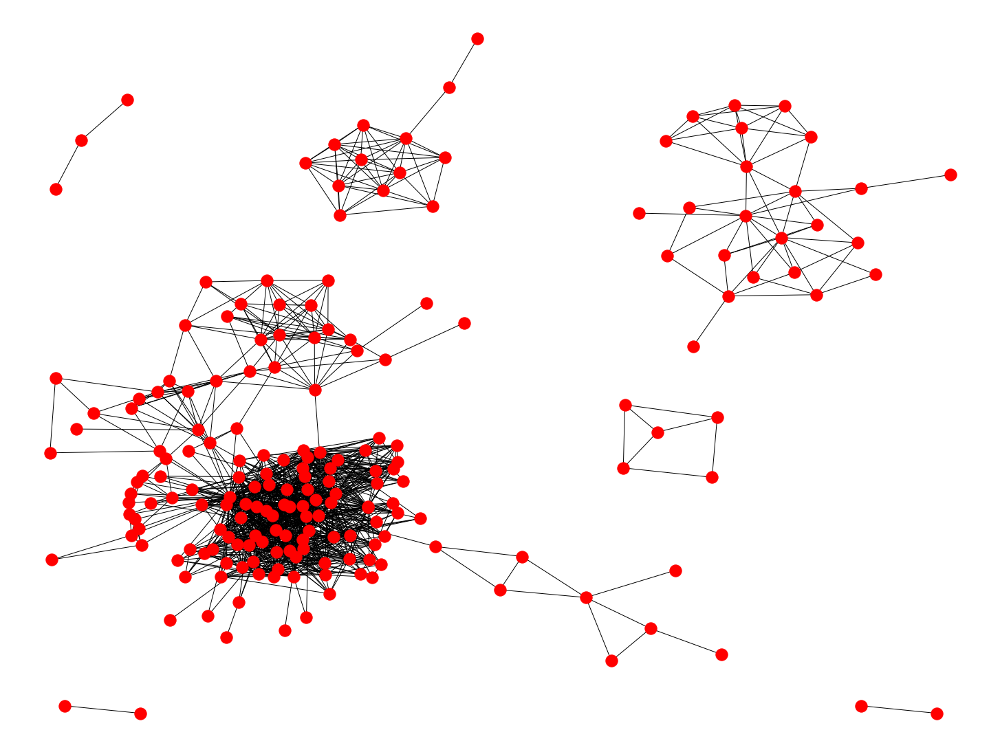

In [134]:
pos = nx.nx_agraph.graphviz_layout(G)
plt.figure(4,figsize=(20,15)) 
color_map = ["red"]
#for node in G:
#    if node <10:
#        color_map.append('blue')
#    else: color_map.append('green')      
#nx.draw(G,node_color = color_map,with_labels = True)
#plt.show()

nx.draw(G, 
        pos,
        font_size=12,
        edge_color='black',
        node_color=color_map, 
        with_labels=False,
       )
plt.savefig("G-spring.png")

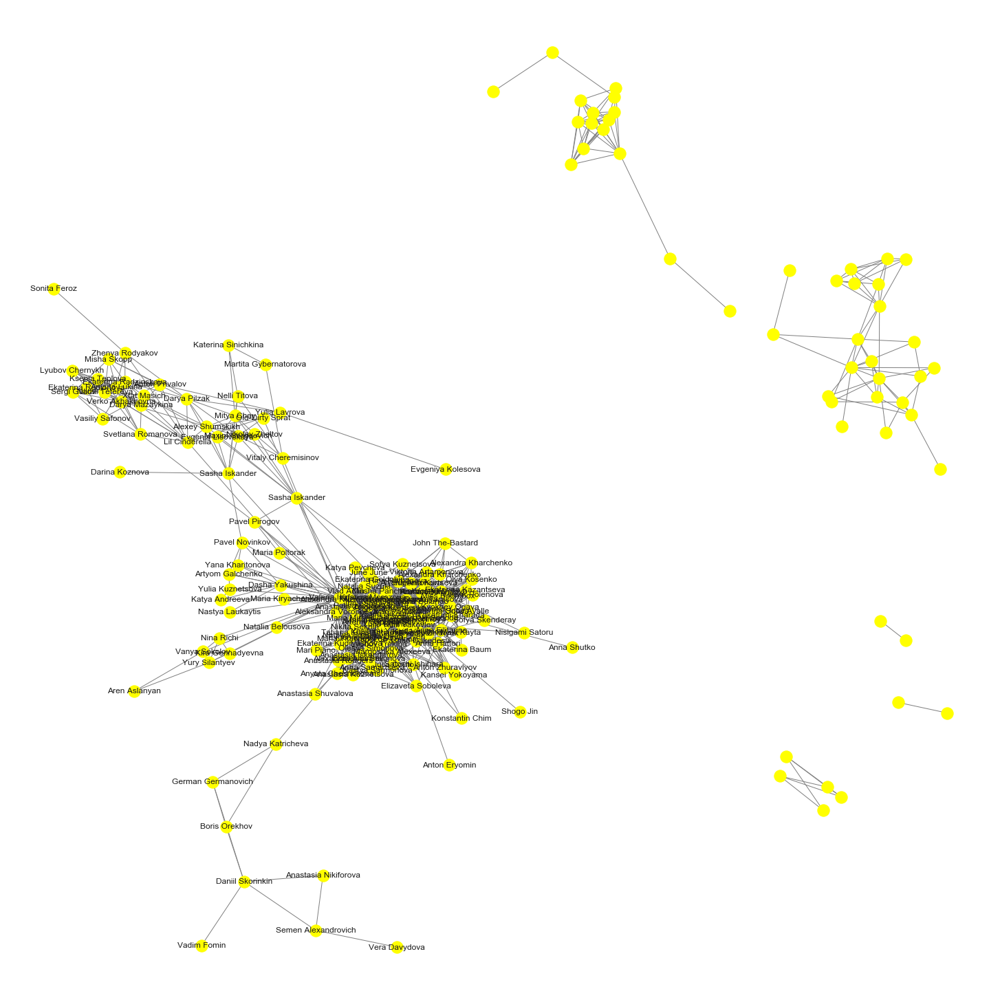

In [135]:
pos = nx.spring_layout(G, k=0.15)
plt.figure(4,figsize=(20,20)) 
nx.draw(G, 
        pos,
        labels = labels,
        font_size=12,
        edge_color='grey',
        node_color='yellow',
       )
# plt.savefig("G-spring.png")

Let's delete all nodes that do not have any connections (with degree 0).

In [32]:
nodes_to_delete = []
for i in nx.isolates(G):
    nodes_to_delete.append(i)

In [33]:
G.remove_nodes_from(nodes_to_delete)

In [34]:
len(G.nodes())

199

In [35]:
labels = {k:v for k,v in labels.items() if k not in nodes_to_delete}

Next I will find all the subgraphs

In [37]:
G_subgr = list(nx.connected_components(G))

In [39]:
for i in G_subgr:
    print(len(i))

150
2
13
3
5
2
24


We see that the biggest one is the first one. I will choose it for counting differet metrics. This is a connected component of my graph. Let's visualize it

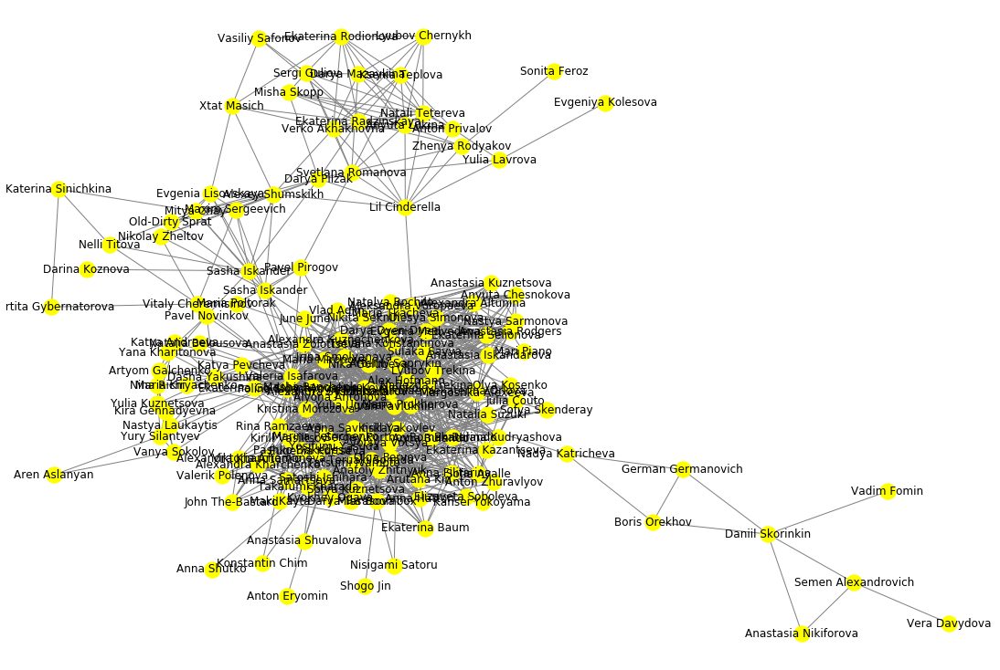

In [47]:
def draw_graph(graph):
    pos = nx.nx_agraph.graphviz_layout(graph)
    plt.figure(4,figsize=(15,10)) 
    nx.draw(graph,
            pos,
            labels=nx.get_node_attributes(graph,'label'),
            node_color="yellow",
           edge_color="grey")

draw_graph(nx.Graph(G.subgraph(G_subgr[0])))

Other graphs with 57 and 48 connections are also interesting. Let's see what friends they consist of. 

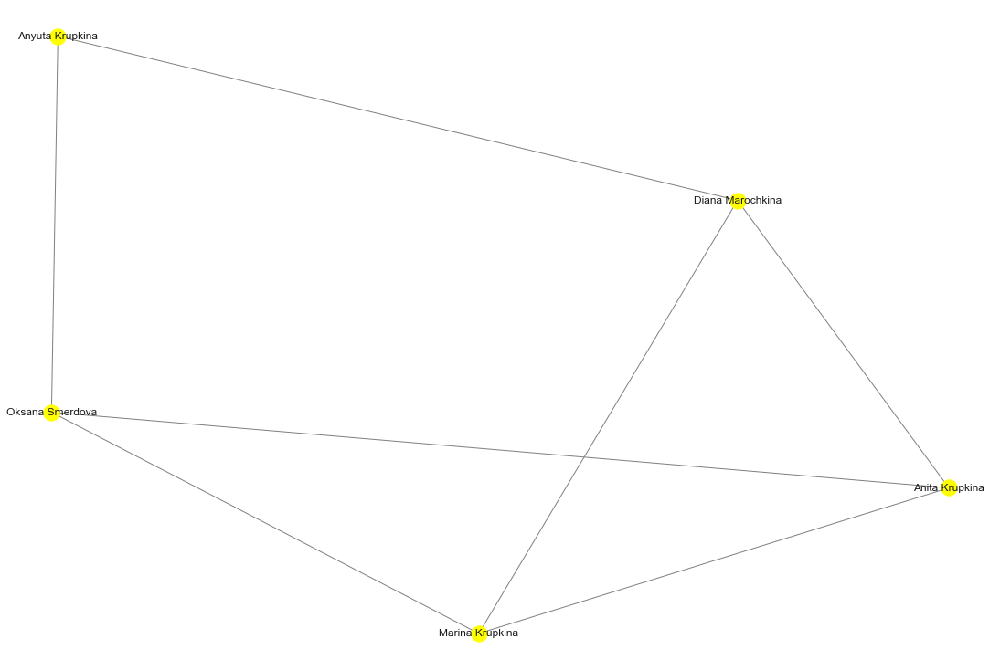

In [263]:
draw_graph(nx.Graph(G.subgraph(G_subgr[4])))
# Most of these are classmates from one of the schools I studied at. 

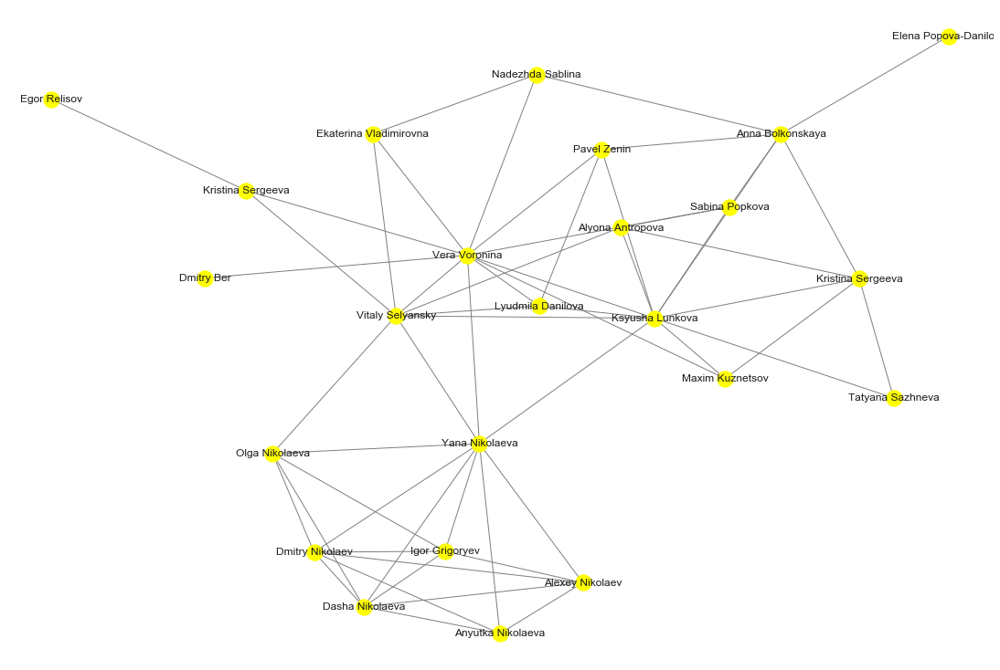

In [264]:
draw_graph(nx.Graph(G.subgraph(G_subgr[6]))) 
# these are my relatives and friends from Tambov, 
# where I was born and where I studied at the elementary school

## 1.2 Descriptive statistics


In [51]:
G_final = nx.Graph(G.subgraph(G_subgr[0]))
print(G_final.size())
print(len(G_final.nodes()))

1217
150


In [52]:
# average node degree
np.mean(list(dict(G_final.degree()).values()))

16.226666666666667

In [53]:
# median node degree
np.median(list(dict(G_final.degree()).values()))

11.0

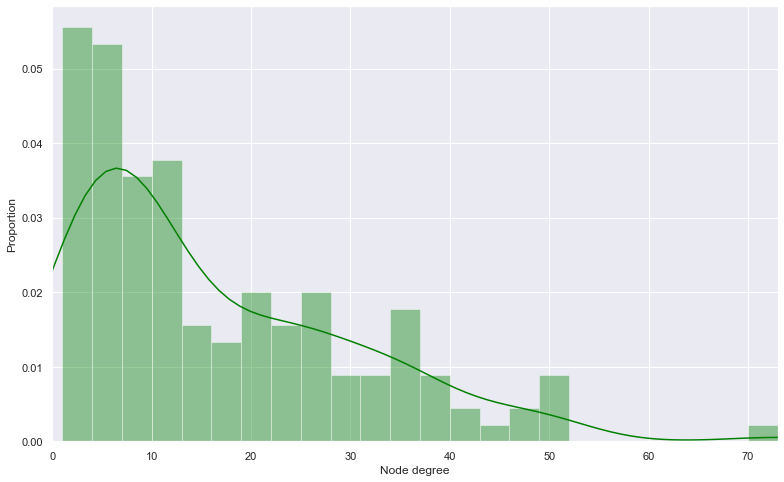

In [54]:
distribution = list(dict(G_final.degree()).values())

sns.set(color_codes=True)

plt.figure(figsize=(13, 8))
#plt.title('Network distribution')
plt.xlabel('Node degree')
plt.ylabel("Proportion")
p = sns.distplot(distribution, 
             color="green",
             norm_hist=True,
             bins=max(distribution)//3).set(xlim=(0, max(distribution)))
sns.set_context(font_scale=1)
plt.savefig("dist.png")

We see that the distribution looks like the power law. 

In [55]:
nx.diameter(G_final)
# наибольшее расстояние между всеми парами вершин графа

9

In [56]:
nx.radius(G_final)
# минимальное расстояние до самой дальней вершины графа среди всех вершин графа

5

In [57]:
nx.average_shortest_path_length(G_final)

2.875436241610738

In graph theory, a clustering coefficient is a measure of the degree to which nodes in a graph tend to cluster together. 

In [58]:
# average clustering coefficient; C with - = ...
nx.average_clustering(G_final)

0.5465119217865451

In [59]:
# global clustering coefficient; C = ... 
nx.transitivity(G_final)

0.4813649564375605

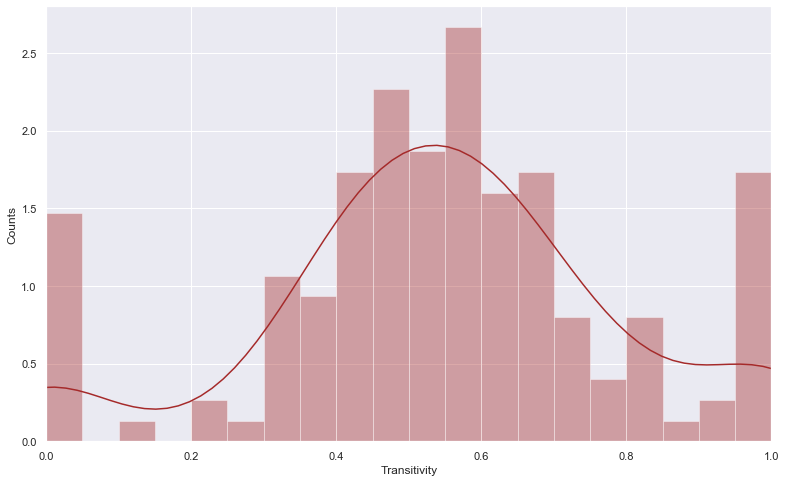

In [60]:
local_cluster_coefs = nx.clustering(G_final)
transitivity = list(local_cluster_coefs.values())


plt.figure(figsize=(13, 8))
sns.distplot(transitivity, 
            color="brown",
            norm_hist=False,
            bins=20).set(xlim=(0, max(transitivity)))

sns.set_context(font_scale=1)
sns.set(color_codes=True)
#plt.title('Transitivity distribution')
plt.xlabel('Transitivity')
plt.ylabel("Counts")
plt.savefig("transitivity.png")

## 2. Structural analysis

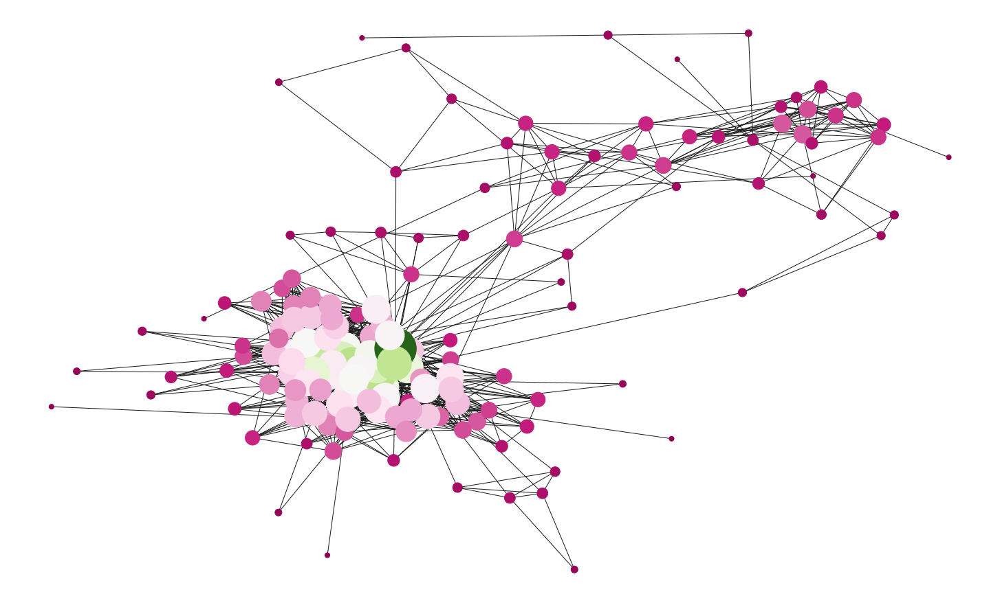

In [348]:
# layout


d = dict(G_final.degree())
node_color = [float(G_final.degree(v)) for v in G_final]
# pos = nx.nx_agraph.graphviz_layout(G_final, prog="fdp")
pos = nx.spring_layout(G_final, k=0.3)
plt.figure(4,figsize=(20,12)) 
nx.draw(G_final, 
        pos,
        labels = {i:v for i,v in labels.items() if i in list(G_final.nodes)},
#        font_size=12,
#        edge_color='grey',
        node_color=node_color,
        node_size=[v * 50 for v in d.values()],
        cmap=plt.cm.PiYG,
        with_labels=False,
       )
plt.savefig("G-PiYG.png")

## 2.1 Centrality

## Normalized degree centrality

In [323]:
wf = open("nodes.csv", "w")
wf.write("id,label\n")
for node, label in nx.get_node_attributes(G_final, "label").items():
    wf.write(node + ',"' + label + '"\n')
wf.close()

In [326]:
wf = open("edges.csv", "w")
wf.write("Source,Target\n")
for edge in G_final.edges():
    wf.write(edge[0] + ',' + edge[1] + '\n')
wf.close()

In [61]:
degree_cent = nx.degree_centrality(G_final)
max_degree_cent = sorted(list(degree_cent.values()), reverse=True)[:5]
max_degree_cent

[0.4899328859060403,
 0.3422818791946309,
 0.3422818791946309,
 0.33557046979865773,
 0.32885906040268453]

In [62]:
labels = nx.get_node_attributes(G_final, "label")

In [63]:
degree_cent_labels = {labels[k]:v for k, v in degree_cent.items()}

In [64]:
for k,v in degree_cent_labels.items():
    if v in max_degree_cent:
        print(k, v)

Ivan Pavlukhin 0.3422818791946309
Nadezda Trekina 0.32885906040268453
Mlada Nikolaeva 0.3422818791946309
Valeria Isafarova 0.4899328859060403
Masha Panchenko 0.33557046979865773


In [268]:
max_degree_cent_d = {k:v for k,v in degree_cent.items() if v in max_degree_cent}
max_degree_cent_d

{'2731540': 0.3422818791946309,
 '3045672': 0.32885906040268453,
 '3472918': 0.3422818791946309,
 '5826972': 0.4899328859060403,
 '15188073': 0.33557046979865773}

In [338]:
len(labels)

150

In [422]:
labels_degree = {}
for k,v in labels.items():
    if k in max_degree_cent_d:
        labels_degree[k] = v
    else:
        labels_degree[k] = ""

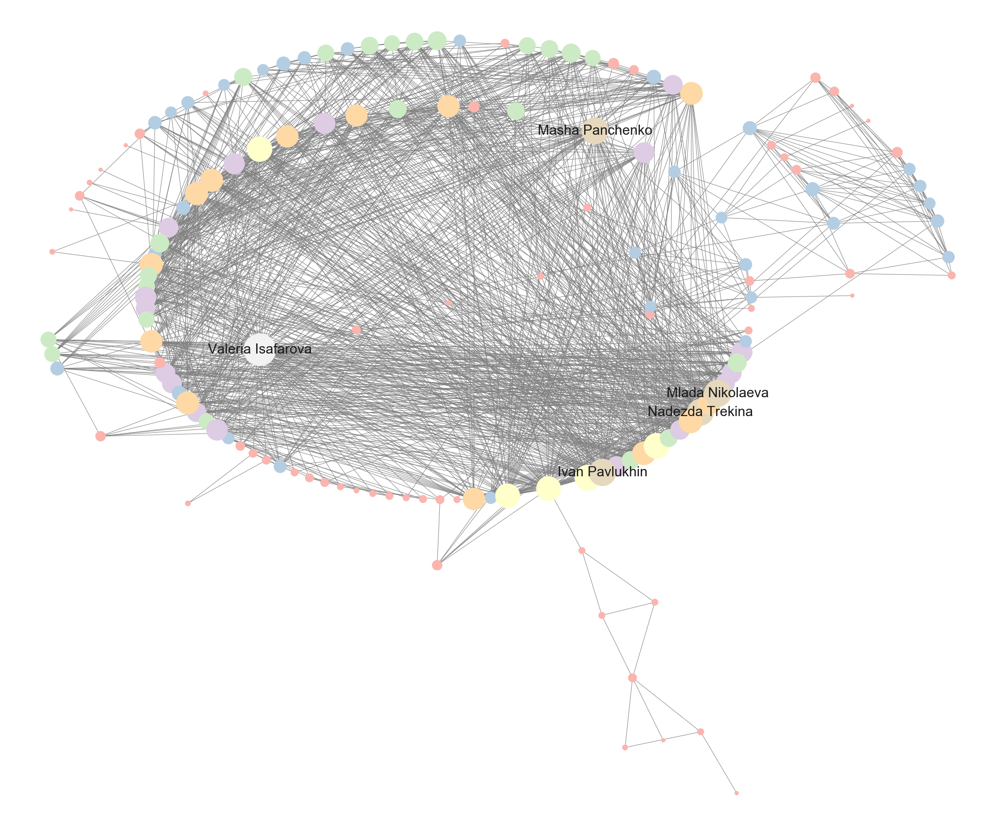

In [423]:
node_color = [float(v) for v in list(degree_cent.values())]
node_size = [float(v)*10000 for v in list(degree_cent.values())]
# pos = nx.spring_layout(G_final, k=0.35)
pos = nx.nx_agraph.graphviz_layout(G_final, prog="twopi")
plt.figure(4,figsize=(30,25)) 
nx.draw(G_final, 
        pos, 
        font_size=30,
        node_color=node_color, 
        node_size=node_size,
        edge_color="grey",
        cmap=plt.cm.Pastel1,
        with_labels=True,
       labels=labels_degree)

## Closeness centrality

In [65]:
closeness_cent = nx.closeness_centrality(G_final)
max_close_cent = sorted(list(closeness_cent.values()), reverse=True)[:5]
max_close_cent

[0.5622641509433962,
 0.48534201954397393,
 0.48534201954397393,
 0.48220064724919093,
 0.48220064724919093]

In [66]:
close_cent_labels = {labels[k]:v for k, v in closeness_cent.items()}

In [67]:
for k,v in close_cent_labels.items():
    if v in max_close_cent:
        print(k,v)

Ivan Pavlukhin 0.48534201954397393
Mlada Nikolaeva 0.48534201954397393
Valeria Isafarova 0.5622641509433962
Masha Panchenko 0.48220064724919093
Aleksandra Voropaeva 0.48220064724919093


In [379]:
max_close_cent_d = {k:v for k,v in closeness_cent.items() if v in max_close_cent}
max_close_cent_d

{'2731540': 0.48534201954397393,
 '3472918': 0.48534201954397393,
 '5826972': 0.5622641509433962,
 '15188073': 0.48220064724919093,
 '95683576': 0.48220064724919093}

In [424]:
labels_close = {}
for k,v in labels.items():
    if k in max_close_cent_d:
        labels_close[k] = v
    else:
        labels_close[k] = ""

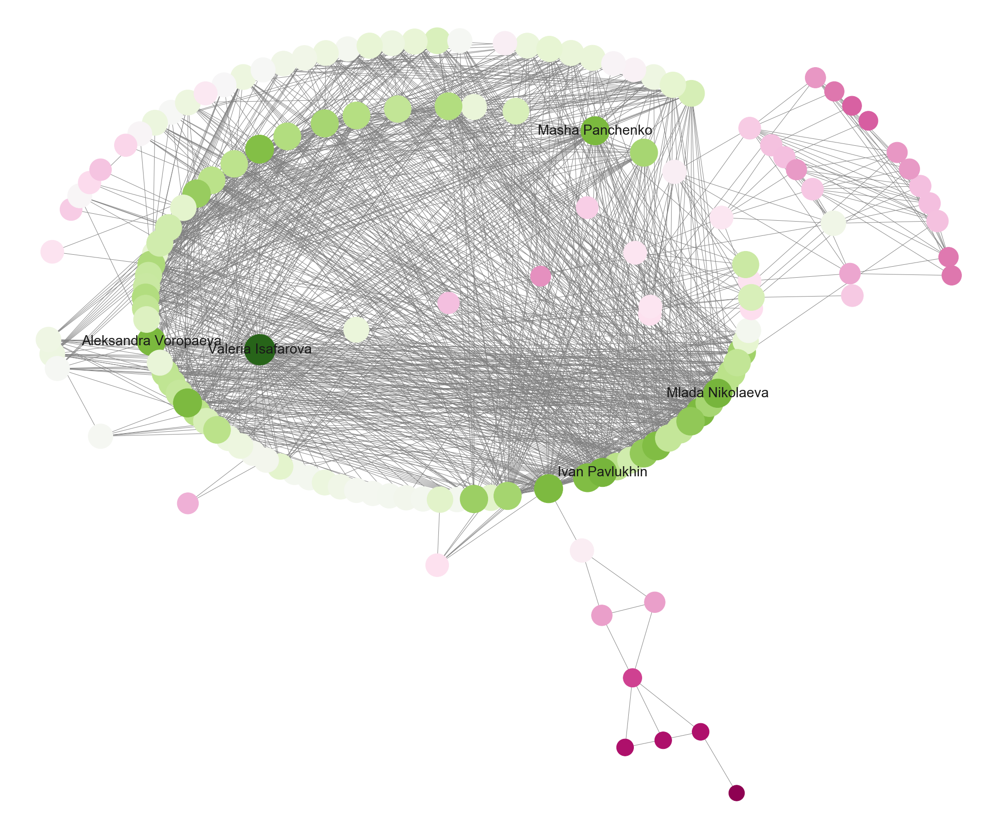

In [425]:
node_color = [float(v) for v in list(closeness_cent.values())]
node_size = [float(v)*8000 for v in list(closeness_cent.values())]
pos = nx.nx_agraph.graphviz_layout(G_final, prog="twopi")
plt.figure(4,figsize=(30,25)) 
nx.draw(G_final, 
        pos, 
        font_size=30,
        node_color=node_color, 
        node_size=node_size,
        edge_color="grey",
        cmap=plt.cm.PiYG,
        with_labels=True,
       labels=labels_close)

## Betweenness centrality

In [68]:
between_cent = nx.betweenness_centrality(G_final)
max_between_cent = sorted(list(between_cent.values()), reverse=True)[:5]
max_between_cent

[0.31326008389749915,
 0.14525817808895397,
 0.13411766010741738,
 0.11109841467752615,
 0.09015055323780156]

In [69]:
between_cent_labels = {labels[k]:v for k, v in between_cent.items()}

In [70]:
for k,v in between_cent_labels.items():
    if v in max_between_cent:
        print(k,v)

Maria Prokhorova 0.11109841467752615
Lil Cinderella 0.13411766010741738
Nadya Katricheva 0.09015055323780156
Valeria Isafarova 0.31326008389749915
Aleksandra Voropaeva 0.14525817808895397


In [418]:
max_between_cent_d = {k:v for k,v in between_cent.items() if v in max_between_cent}
max_between_cent_d

{'2066680': 0.11109841467752615,
 '3879093': 0.13411766010741738,
 '5782122': 0.09015055323780156,
 '5826972': 0.31326008389749915,
 '95683576': 0.14525817808895397}

In [427]:
labels_between = {}
for k,v in labels.items():
    if k in max_between_cent_d:
        labels_between[k] = v
    else:
        labels_between[k] = ""

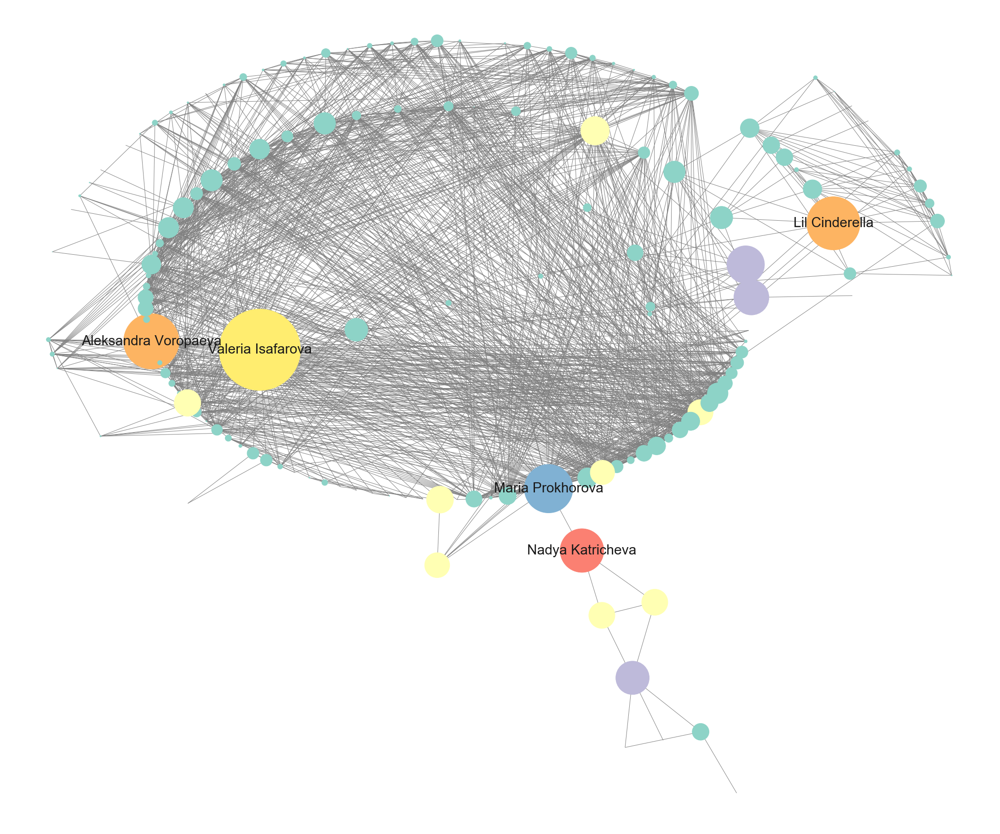

In [431]:
node_color = [float(v) for v in list(between_cent.values())]
node_size = [float(v)*100000 for v in list(between_cent.values())]
pos = nx.nx_agraph.graphviz_layout(G_final, prog="twopi")
plt.figure(4,figsize=(30,25)) 
nx.draw(G_final, 
        pos, 
        font_size=30,
        node_color=node_color, 
        node_size=node_size,
        edge_color="grey",
        cmap=plt.cm.Set3,
        with_labels=True,
       labels=labels_between)

## Eigenvector centrality

In [71]:
eigen_cent = nx.eigenvector_centrality(G_final)
max_eigen_cent = sorted(list(eigen_cent.values()), reverse=True)[:5]
max_eigen_cent

[0.21472149017934108,
 0.20283409843703792,
 0.18971529912804405,
 0.18892239394158736,
 0.18827205442391268]

In [72]:
eigen_cent_labels = {labels[k]:v for k, v in eigen_cent.items()}

In [73]:
for k,v in eigen_cent_labels.items():
    if v in max_eigen_cent:
        print(k,v)

Ivan Pavlukhin 0.18827205442391268
Angelina Kovalenko 0.18892239394158736
Mlada Nikolaeva 0.20283409843703792
Valeria Isafarova 0.21472149017934108
Masha Panchenko 0.18971529912804405


In [432]:
max_eigen_cent_d = {k:v for k,v in eigen_cent.items() if v in max_eigen_cent}
max_eigen_cent_d

{'2731540': 0.18827205442391268,
 '3214550': 0.18892239394158736,
 '3472918': 0.20283409843703792,
 '5826972': 0.21472149017934108,
 '15188073': 0.18971529912804405}

In [433]:
labels_eigen = {}
for k,v in labels.items():
    if k in max_eigen_cent_d:
        labels_eigen[k] = v
    else:
        labels_eigen[k] = ""

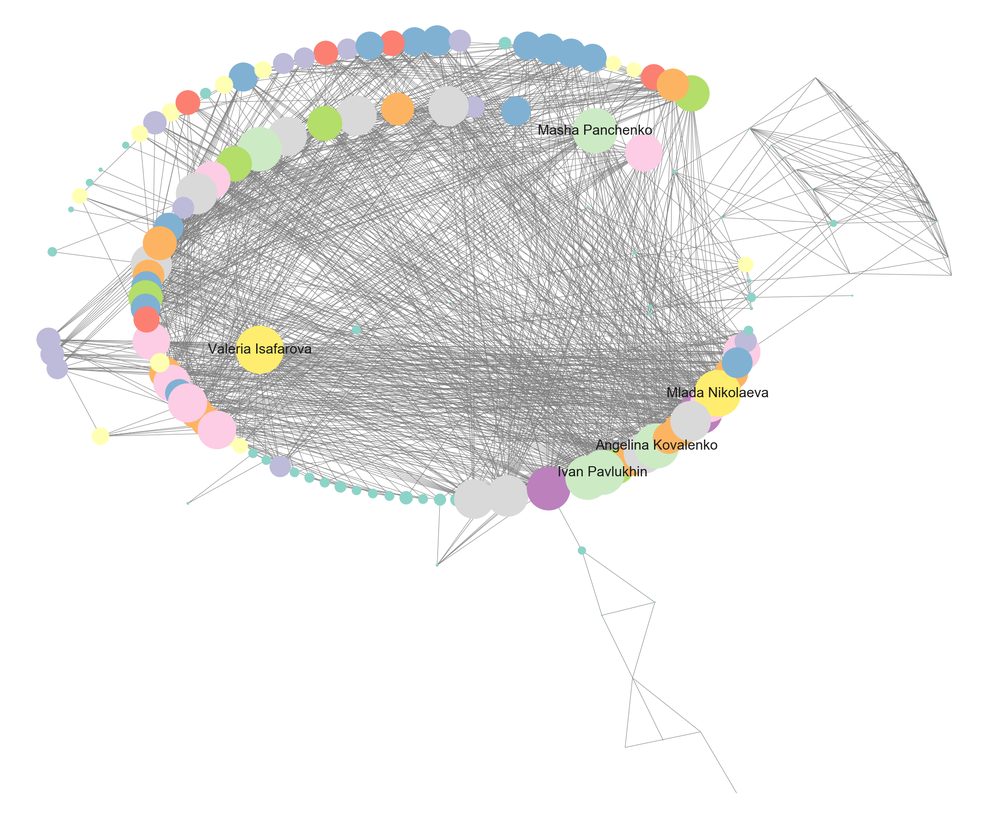

In [437]:
node_color = [float(v) for v in list(eigen_cent.values())]
node_size = [float(v)*50000 for v in list(eigen_cent.values())]
pos = nx.nx_agraph.graphviz_layout(G_final, prog="twopi")
plt.figure(4,figsize=(30,25)) 
nx.draw(G_final, 
        pos, 
        font_size=30,
        node_color=node_color, 
        node_size=node_size,
        edge_color="grey",
        cmap=plt.cm.Set3,
        with_labels=True,
       labels=labels_eigen)

## 2.2 PageRank

In [74]:
pr = nx.pagerank(G_final, max_iter=100, alpha=0.85)
max_prs = sorted(list(pr.values()), reverse=True)[:5]
max_prs

[0.028998588414899697,
 0.0154913263434235,
 0.015181967452492184,
 0.014866483711403235,
 0.014621840020984466]

In [75]:
pr_labels = {labels[k]:v for k, v in pr.items()}

In [76]:
for k,v in pr_labels.items():
    if v in max_prs:
        print(k,v)
        
# the names of friends and their order doesn't change depending on alpha
# same as top nodes from degree centrality (it is logically understandable)

Ivan Pavlukhin 0.015181967452492184
Nadezda Trekina 0.014621840020984466
Mlada Nikolaeva 0.014866483711403235
Valeria Isafarova 0.028998588414899697
Masha Panchenko 0.0154913263434235


## 2.3 Assortative mixing

In [77]:
nx.attribute_assortativity_coefficient(G_final,'sex')

0.07791637671451145

Let's preprocess one more attribute - date of birth - to measures the similarity of connections in the graph depending on the generation.  

In [78]:
dates_of_birth = nx.get_node_attributes(G_final, "bdate")

In [79]:
dates_of_birth

{'441823': '2.11.1989',
 '640287': '30.9.1982',
 '714270': '26.7',
 '1136265': '8.5',
 '1318036': '24.11.1983',
 '1359114': '2.1.1994',
 '1483072': '8.6',
 '1511841': '5.2',
 '1642695': '19.3',
 '1687066': '17.3.1990',
 '1703790': '6.8',
 '1744767': '31.7',
 '1778098': '28.4',
 '1855006': '9.9',
 '1855511': '4.11',
 '1867136': '23.1',
 '2031946': '27.12',
 '2061175': '30.3',
 '2066680': '11.3.1994',
 '2087532': '25.5.1992',
 '2316566': '24.10',
 '2441982': '9.2',
 '2487623': '7.2',
 '2568354': '18.7.1992',
 '2731540': '25.3.1990',
 '2799566': '2.7.1991',
 '3017742': '8.9.1992',
 '3045672': '12.9',
 '3048076': '12.9.1992',
 '3147269': '5.10.1992',
 '3164665': '27.1',
 '3214550': '14.10.1992',
 '3250941': '28.1',
 '3472918': '30.8.1992',
 '3606720': '9.12',
 '3879093': '12.12',
 '3962945': '30.5',
 '4215990': '28.9',
 '4298259': '14.4',
 '4420898': '30.10.1992',
 '4424514': '11.7',
 '4662608': '30.4',
 '4905442': '9.3',
 '5017786': '27.8',
 '5178330': '1.3.1992',
 '5211133': '18.3',
 '54

In [82]:
for id_, date in dates_of_birth.items():
    if date.count(".") == 1: 
        del G_final.nodes[str(id_)]['bdate'] # delete node attribute "bdate" without year: for example, '7.2' 
    elif date.count(".") == 2:
        date = int(date.split(".")[-1]) # '10.01.1992' becomes '1992'
        date = str(int(round(date/10, 0) * 10)) # 1992 becomes "1990", 1996 becomes "2000"
        G_final.nodes[str(id_)]['bdate'] = date

In [83]:
new_dates_of_birth = nx.get_node_attributes(G_final, "bdate")

In [84]:
len(labels)

150

In [85]:
len(dates_of_birth)

112

In [90]:
len(new_dates_of_birth)

58

In [91]:
# so there are 4 generations, let's look at their similarity

In [92]:
nx.attribute_assortativity_coefficient(G_final,'bdate')
# negative values indicate relationships between nodes of different degree
# not reliable

-0.025357150775643468

## Comparison to random graphs

In [439]:
def get_graph_statistics(G:nx.Graph, graph_name:str):
    
    n_edges = G.size()
    n_nodes = len(G.nodes())
    avg_node_degree = round(np.mean(list(dict(G.degree()).values())),2)
    avg_clust_coef = round(nx.average_clustering(G),2)
    avg_short_path = round(nx.average_shortest_path_length(G),2)
    diameter = round(nx.diameter(G),2)
    density = round(nx.density(G),2)
    
    print(graph_name)
    print(G.size(), "- number of edges")
    print(len(G.nodes()), " - number of nodes")
    print(round(np.mean(list(dict(G.degree()).values())),2), "- average node degree")
    print(round(nx.average_clustering(G),2), "- average clustering coefficient")
    print(round(nx.average_shortest_path_length(G),2), "- average shortest path length")
    print(round(nx.diameter(G),2), "- diameter")
    print(round(nx.density(G),2), "- density")
    
    return [n_edges, n_nodes, avg_node_degree, avg_clust_coef, avg_short_path, diameter, density]

In [440]:
my_graph_data = get_graph_statistics(G_final, "My graph")

My graph
1217 - number of edges
150  - number of nodes
16.23 - average node degree
0.55 - average clustering coefficient
2.88 - average shortest path length
9 - diameter
0.11 - density


In [441]:
erdos_graph = nx.erdos_renyi_graph(n=150,p=0.11)
erdos_graph_data = get_graph_statistics(erdos_graph, "Erdős-Rényi graph")

Erdős-Rényi graph
1239 - number of edges
150  - number of nodes
16.52 - average node degree
0.1 - average clustering coefficient
2.03 - average shortest path length
3 - diameter
0.11 - density


In [442]:
babarasi_graph = nx.barabasi_albert_graph(n=150, m=9)
babarasi_graph_data = get_graph_statistics(babarasi_graph, "Barabasi Albert graph")

Barabasi Albert graph
1269 - number of edges
150  - number of nodes
16.92 - average node degree
0.21 - average clustering coefficient
2.02 - average shortest path length
3 - diameter
0.11 - density


In [443]:
watts_graph = nx.watts_strogatz_graph(n=150, k=17, p=0.05)
watts_graph_data = get_graph_statistics(watts_graph, "Watts–Strogatz graph")

Watts–Strogatz graph
1200 - number of edges
150  - number of nodes
16.0 - average node degree
0.61 - average clustering coefficient
2.66 - average shortest path length
5 - diameter
0.11 - density


In [444]:
powerlaw_graph = nx.powerlaw_cluster_graph(n=150, m=9, p=0.95)
powerlaw_graph_data = get_graph_statistics(powerlaw_graph, "Graph with powerlaw degree distribution and approximate average clustering.")


Graph with powerlaw degree distribution and approximate average clustering.
1259 - number of edges
150  - number of nodes
16.79 - average node degree
0.43 - average clustering coefficient
2.13 - average shortest path length
4 - diameter
0.11 - density


In [445]:
graph_list = [my_graph_data, erdos_graph_data, erdos_graph_data, watts_graph_data, powerlaw_graph_data]
random_graphs = pd.DataFrame(graph_list, columns = ["n_edges", "n_nodes", 
                                                    "avg_node_degree", 
                                                    "avg_clust_coef", 
                                                    "avg_short_path", 
                                                    "diameter", "density"])

In [446]:
random_graphs.head()

,n_edges,n_nodes,avg_node_degree,avg_clust_coef,avg_short_path,diameter,density
0,1217,150,16.23,0.55,2.88,9,0.11
1,1239,150,16.52,0.10,2.03,3,0.11
2,1239,150,16.52,0.10,2.03,3,0.11
3,1200,150,16.00,0.61,2.66,5,0.11
4,1259,150,16.79,0.43,2.13,4,0.11


In [447]:
random_graphs["graph_name"] = ["My Graph", "Erdős-Rényi (p=0.11)", "Barabasi Albert (m=9)", "Watts–Strogatz (k=17, p=0.05)", "Powerlaw Graph (m=9, p=0.95)"]

In [448]:
random_graphs.head()

,n_edges,n_nodes,avg_node_degree,avg_clust_coef,avg_short_path,diameter,density,graph_name
0,1217,150,16.23,0.55,2.88,9,0.11,My Graph
1,1239,150,16.52,0.10,2.03,3,0.11,Erdős-Rényi (p=0.11)
2,1239,150,16.52,0.10,2.03,3,0.11,Barabasi Albert (m=9)
3,1200,150,16.00,0.61,2.66,5,0.11,"Watts–Strogatz (k=17, p=0.05)"
4,1259,150,16.79,0.43,2.13,4,0.11,"Powerlaw Graph (m=9, p=0.95)"


In [449]:
random_graphs.set_index(keys=["graph_name"], inplace=True)
random_graphs.head()

,n_edges,n_nodes,avg_node_degree,avg_clust_coef,avg_short_path,diameter,density
graph_name,,,,,,,
My Graph,1217,150,16.23,0.55,2.88,9,0.11
Erdős-Rényi (p=0.11),1239,150,16.52,0.10,2.03,3,0.11
Barabasi Albert (m=9),1239,150,16.52,0.10,2.03,3,0.11
"Watts–Strogatz (k=17, p=0.05)",1200,150,16.00,0.61,2.66,5,0.11
"Powerlaw Graph (m=9, p=0.95)",1259,150,16.79,0.43,2.13,4,0.11


## 3. Community detection

## 3.1 Clique search

In [105]:
max_cliques = list(nx.find_cliques(G_final))
len(max_cliques)

706

In [106]:
max_clique = []
max_clique_len = 5
for i,clique in enumerate(max_cliques):
    clique_len = len(clique)
    if clique_len > max_clique_len:
        max_clique_len = clique_len
        max_clique = clique

In [107]:
max_clique

['5826972',
 '15188073',
 '14373337',
 '20387378',
 '16921166',
 '92029349',
 '11501080',
 '3472918',
 '96261219',
 '10027497',
 '3214550',
 '2609635',
 '2066680',
 '1855511',
 '2061175',
 '53140234']

In [108]:
len(max_clique)

16

In [109]:
for i in max_clique:
    print(labels[i])

Valeria Isafarova
Masha Panchenko
Yulia Ugrina
Ekaterina Goldobina
Polina Sigachyova
Anastasia Zolottseva
Irina Smolyanaya
Mlada Nikolaeva
Kristina Morozova
Alexandra Syschikova
Angelina Kovalenko
Kirill Isafarov
Maria Prokhorova
Maria Mironova
Anna Savinskaya
Nika Golubeva


In [110]:
# vizualization: max_clique among other max cliques
max_clique_graph = nx.make_max_clique_graph(G_final)
len(max_clique_graph.nodes())

706

## 3.2 Community detection

In [111]:
import networkx as nx
from networkx.algorithms import community
from networkx.algorithms.community import quality

## 3.2.1 Girvan–Newman method

In [112]:
# girvan_newman
communities_generator = community.girvan_newman(G_final)
top_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)
girvan_communities = sorted(map(sorted, next_level_communities))
#girvan_communities = sorted(map(sorted, communities_generator))

In [113]:
quality.modularity(G_final, girvan_communities)

0.17756832978977033

In [114]:
len(girvan_communities)

3

In [453]:
girvan_labels = [[labels[i] for i in j] for j in girvan_communities]
print(girvan_labels)

[['Alexandra Syschikova', 'Anastasia Rodgers', 'Roman Bulando', 'Nikita Seknin', 'Yosifumi Yasuda', 'Tatsumi Ivamoto', 'Ekaterina Kudryashova', 'Anna Filitarina', 'Irina Smolyanaya', 'Alexandra Kuznechenkova', 'Satoshi Ishihara', 'Alyona Antonova', 'Maria Tkacheva', 'Natalya Bochilo', 'Elizaveta Soboleva', 'Anton Zhuravlyov', 'Sofia Avalle', 'Marina Petrichenko', 'Ekaterina Kazantseva', 'Yulia Ugrina', 'Julia Couto', 'Teruaki Sonoda', 'Masha Panchenko', 'Arutana Kin', 'Votsya Votsya', 'Anton Eryomin', 'Pashko Dakedesu', 'Polina Sigachyova', 'Nastya Sarmonova', 'Katya Andreeva', 'Pavel Pirogov', 'Artemy Saprykin', 'Kansei Yokoyama', 'Nisigami Satoru', 'Takafumi Kharada', 'Eugenia Kurtseva', 'Sulaka Savva', 'Maria Mironova', 'Kyokhey Ogava', 'Maki Kayta', 'Olga Pervova', 'Valerik Polenova', 'Yulia Kuznetsova', 'Anna Shutko', 'Ekaterina Goldobina', 'Sofya Skenderay', 'Anna Savinskaya', 'Shogo Jin', 'Maria Prokhorova', 'Anatoly Zhitnyuk', 'Anastasia Shuvalova', 'Maria Kiryachenko', 'Ekater

In [520]:
com_d = {}
for node in G_final.nodes():
    for j, com in enumerate(girvan_communities):
        for i in com:
            if i == node:
                com_d[i] = j

In [522]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=5.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.Graph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

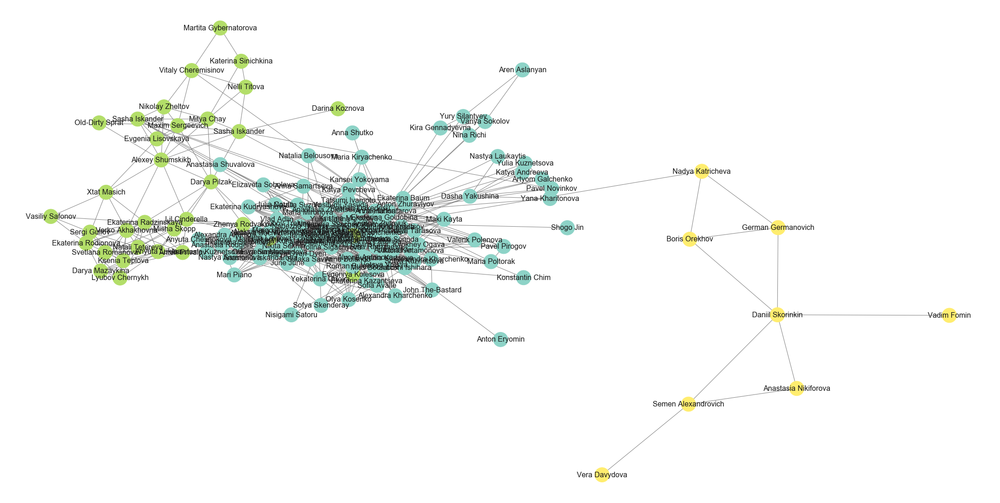

In [523]:
plt.figure(4,figsize=(30,15)) 
pos = community_layout(G_final, com_d)
nx.draw(G_final, 
        pos, 
        node_color=list(com_d.values()),
        cmap=plt.cm.Set3,
       node_size=1000,
       with_labels=True,
       labels=labels,
       font_size=16,
       edge_color="grey") 

plt.show()

## 3.2.2 Clauset-Newman-Moore greedy modularity maximization

In [116]:
communities_generator = community.greedy_modularity_communities(G_final)
modularity_communities = sorted(map(sorted, communities_generator))

In [117]:
quality.modularity(G_final, modularity_communities)

0.30746126667607176

In [118]:
len(modularity_communities)

6

In [119]:
modularity_labels = [[labels[i] for i in j] for j in modularity_communities]
print(modularity_labels)

[['Alexandra Syschikova', 'Yosifumi Yasuda', 'Tatsumi Ivamoto', 'Ekaterina Kudryashova', 'Anna Filitarina', 'Irina Smolyanaya', 'Alyona Antonova', 'Elizaveta Soboleva', 'Anton Zhuravlyov', 'Marina Petrichenko', 'Yulia Ugrina', 'Julia Couto', 'Teruaki Sonoda', 'Masha Panchenko', 'Arutana Kin', 'Pashko Dakedesu', 'Polina Sigachyova', 'Artemy Saprykin', 'Kansei Yokoyama', 'Takafumi Kharada', 'Eugenia Kurtseva', 'Maria Mironova', 'Kyokhey Ogava', 'Maki Kayta', 'Olga Pervova', 'Valerik Polenova', 'Anna Shutko', 'Ekaterina Goldobina', 'Anna Savinskaya', 'Shogo Jin', 'Maria Prokhorova', 'Anatoly Zhitnyuk', 'Anastasia Shuvalova', 'Ekaterina Baum', 'Vlad Adlin', 'Kirill Isafarov', 'Ivan Pavlukhin', 'Margoshka Alexeeva', 'Nadezda Trekina', 'Lyubov Trekina', 'Natalia Suzuki', 'Angelina Kovalenko', 'Anna Samartseva', 'Rina Ramzaeva', 'Mlada Nikolaeva', 'Darya Tarasova', 'Kirill Vasiltsov', 'Sergey Portnoy', 'Viktoria Artamonova', 'June June', 'Nika Golubeva', 'Anna Hattori', 'Katya Pevcheva', 'Ana

In [524]:
com_d = {}
for node in G_final.nodes():
    for j, com in enumerate(modularity_communities):
        for i in com:
            if i == node:
                com_d[i] = j

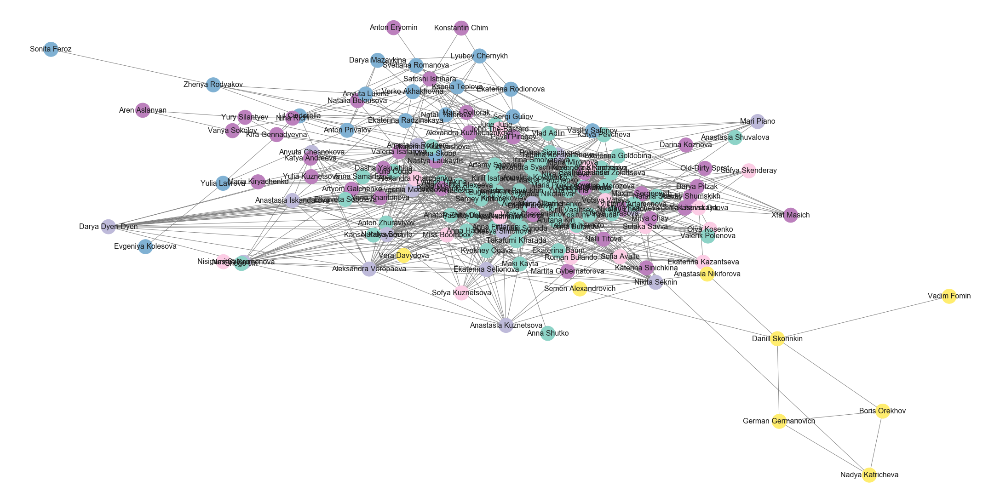

In [528]:
plt.figure(4,figsize=(30,15)) 
pos = community_layout(G_final, com_d)
nx.draw(G_final, 
        pos, 
        node_color=list(com_d.values()),
        cmap=plt.cm.Set3,
       node_size=1000,
       with_labels=True,
       labels=labels,
       font_size=16,
       edge_color="grey") 

plt.show()

## 3.2.3 Fluid Communities algorithm

Here we need to choose the number of groups (k) for maximum modularity score. 

In [120]:
d = {}
for n_groups in range(2, 15):
    communities_generator = community.asyn_fluidc(G_final, k = n_groups)
    fluid_communities = sorted(map(sorted, communities_generator))
    modularity = quality.modularity(G_final, fluid_communities)
    d[n_groups] = modularity

In [121]:
d

{2: 0.18998284370486995,
 3: 0.2415411902998419,
 4: 0.2902310394581283,
 5: 0.31564781049619606,
 6: 0.33416695418033415,
 7: 0.33545148198386326,
 8: 0.3190638779978784,
 9: 0.34550692092102425,
 10: 0.32545849709234126,
 11: 0.2898664428673761,
 12: 0.32322466779511483,
 13: 0.3047602135995871,
 14: 0.31033212723880804}

As we have different result every time, let's make the procedure 100 times and take the mean modularity for every k. 

In [122]:
d = {i:[] for i in range(2, 15)}
iter_ = 0
max_iter = 100
while iter_ < max_iter:
    for n_groups in range(2, 15):
        communities_generator = community.asyn_fluidc(G_final, k = n_groups)
        fluid_communities = sorted(map(sorted, communities_generator))
        modularity = quality.modularity(G_final, fluid_communities)
        d[n_groups].append(modularity)
    iter_ += 1

In [123]:
for k, v in d.items():
    d[k] = np.mean(v)
d

{2: 0.16342301171638016,
 3: 0.24605218862607253,
 4: 0.29495199815811196,
 5: 0.3221444761253373,
 6: 0.33112424033937143,
 7: 0.33209448588167156,
 8: 0.3347426657007101,
 9: 0.3299031725979997,
 10: 0.3249024535325013,
 11: 0.3168021773168249,
 12: 0.3117299298016521,
 13: 0.3051529820287634,
 14: 0.2949716222320191}

Text(0, 0.5, 'Modularity')

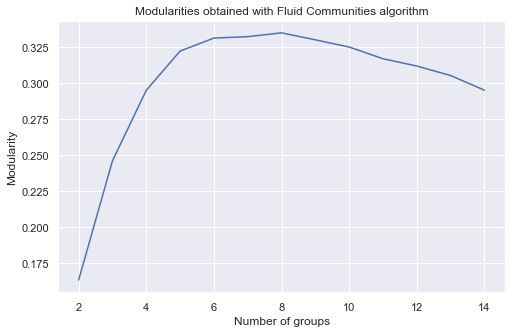

In [124]:
plt.figure(4,figsize=(8,5)) 
sns.lineplot(x=list(d.keys()), 
            y=list(d.values()),
            )
plt.title('Modularities obtained with Fluid Communities algorithm')
plt.xlabel('Number of groups')
plt.ylabel("Modularity")

In [132]:
# So, let's take k = 8
communities_generator = community.asyn_fluidc(G_final, k = 8)
fluid_communities = sorted(map(sorted, communities_generator))
quality.modularity(G_final, fluid_communities)

0.35064536972457283

In [453]:
fluid_labels = [[labels[i] for i in j] for j in fluid_communities]
print(fluid_labels)

[['Alexandra Syschikova', 'Yosifumi Yasuda', 'Tatsumi Ivamoto', 'Ekaterina Kudryashova', 'Irina Smolyanaya', 'Alexandra Kuznechenkova', 'Satoshi Ishihara', 'Marina Petrichenko', 'Yulia Ugrina', 'Masha Panchenko', 'Anton Eryomin', 'Pashko Dakedesu', 'Polina Sigachyova', 'Artemy Saprykin', 'Maria Mironova', 'Olga Pervova', 'Valerik Polenova', 'Ekaterina Goldobina', 'Anna Savinskaya', 'Maria Prokhorova', 'Maria Kiryachenko', 'Vlad Adlin', 'Ivan Pavlukhin', 'Natalia Suzuki', 'Angelina Kovalenko', 'Anna Samartseva', 'Rina Ramzaeva', 'Natalia Belousova', 'Darya Tarasova', 'Kirill Vasiltsov', 'Sergey Portnoy', 'Alex Hofmann', 'June June', 'Nika Golubeva', 'Valeria Isafarova', 'Maria Poltorak', 'Katya Pevcheva', 'Anastasia Zolottseva', 'Kirill Yakovlev', 'Kristina Morozova'], ['Anastasia Rodgers', 'Nikita Seknin', 'Maria Tkacheva', 'Natalya Bochilo', 'Elizaveta Soboleva', 'Julia Couto', 'Nastya Sarmonova', 'Sulaka Savva', 'Anastasia Kuznetsova', 'Kirill Isafarov', 'Margoshka Alexeeva', 'Nadezd

In [529]:
com_d = {}
for node in G_final.nodes():
    for j, com in enumerate(fluid_communities):
        for i in com:
            if i == node:
                com_d[i] = j

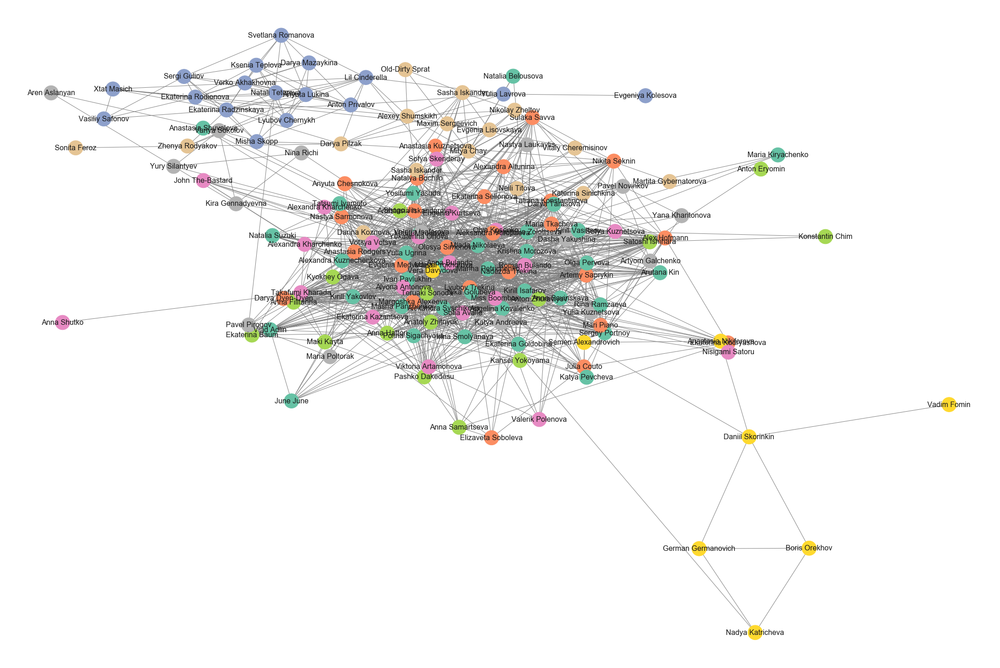

In [535]:
plt.figure(4,figsize=(30,20)) 
pos = community_layout(G_final, com_d)
nx.draw(G_final, 
        pos, 
        node_color=list(com_d.values()),
        cmap=plt.cm.Set2,
       node_size=1000,
       with_labels=True,
       labels=labels,
       font_size=16,
       edge_color="grey") 

plt.show()